# trajectory prediction in the Nuscenes dataset


In [6]:
# Let's start by initializing the database
%matplotlib inline
from nuscenes_utils.nuscenes import NuScenes
import numpy as np
from nuscenes_utils.LSTMhelpers import *
nusc = NuScenes(version='v0.1', dataroot='/home/jose/data/nuscenes', verbose=True)

map_data_all = load_traj_data(nusc , show = False)

fs = 2
split_size = 5*fs #samples
step = 2*fs #samples
map_data_split = np.array(split_data(split_size, step, map_data_all))

#np.save('map_data_split',map_data_split)

Loading NuScenes tables for version v0.1 ...
23 category,
8 attribute,
5 visibility,
6975 instance,
12 sensor,
1200 calibrated_sensor,
304715 ego_pose,
12 log,
100 scene,
3977 sample,
304715 sample_data,
99952 sample_annotation,
12 map,
Done loading in 2.8 seconds.
Reverse indexing ...
Done reverse indexing in 0.7 seconds.


In [9]:
indexes = np.load('indexes.npy')
data_predicted = np.load('data_predicted1.npy')
data_predicted = data_predicted[:,:, 0:10]

In [18]:
#Reorganize predicted data so it has shape scenes x partitions x instances x timesteps x 2
i = 0
#*map_split_predicted = []
partitions_pred = {'scenes': [], 'partitions':[]}
while(i<data_predicted.shape[0]):
    scene_ix = indexes[i,0]
    partition_ix = indexes[i,1]
    partition_predicted = np.ones(map_data_split[scene_ix][partition_ix].shape)*(-999)
    while(indexes[i,1] == partition_ix and i<data_predicted.shape[0]):
        partition_predicted[indexes[i,2],:,0] = data_predicted[i,0,:]
        partition_predicted[indexes[i,2],:,1] = data_predicted[i,1,:]
        i += 1 
    partitions_pred['partitions'].append(partition_predicted)
    partitions_pred['scenes'].append(indexes[i-1,0])

                

In [ ]:
#plot partition 
scene_i = 0
scenes = nusc.scene
record = scenes[scene_i]

partition = map_data_split[scene_i][0]

instance_tokens = map_data_all[scene_i]['instance_tokens'] #extra index is not useful

# SHOW TRAJECTORY PREDICTION IN MAP

/home/jose/.virtualenvs/nuscenes/lib/python3.7/site-packages/matplotlib/axes/_base.py:3152: UserWarning: Attempting to set identical left==right results
in singular transformations; automatically expanding.
left=21494.59448290332, right=21494.59448290332
  'left=%s, right=%s') % (left, right))
/home/jose/.virtualenvs/nuscenes/lib/python3.7/site-packages/matplotlib/axes/_base.py:3471: UserWarning: Attempting to set identical bottom==top results
in singular transformations; automatically expanding.
bottom=12606.958110504782, top=12606.958110504782
  'bottom=%s, top=%s') % (bottom, top))


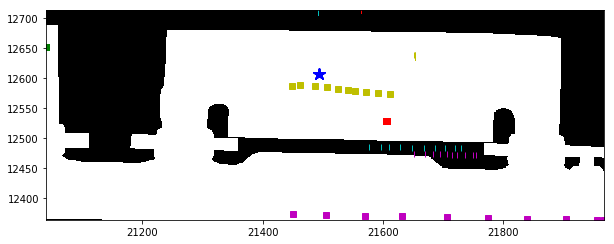

In [20]:
#plot_traj_partition(nusc, record, partition, instance_tokens)
plot_traj_partition(nusc, record, partitions_pred['partitions'][1], instance_tokens)

# SHOW REAL TRAJECTORY IN MAP FOR A SCENE

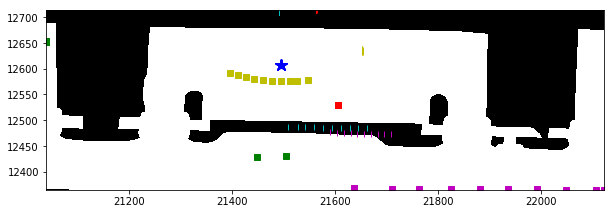

In [91]:
plot_traj_partition(nusc, record, partition, instance_tokens)

### VISUALIZATION OF SCENES

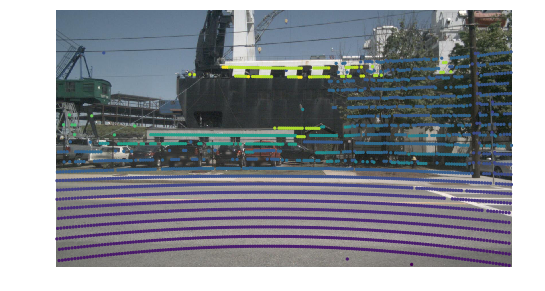

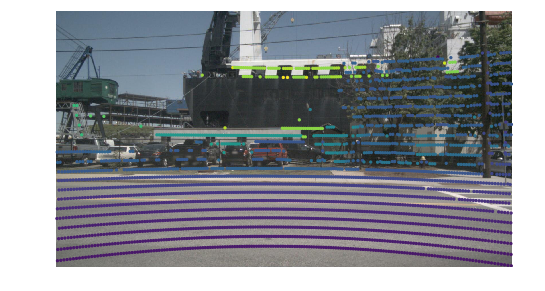

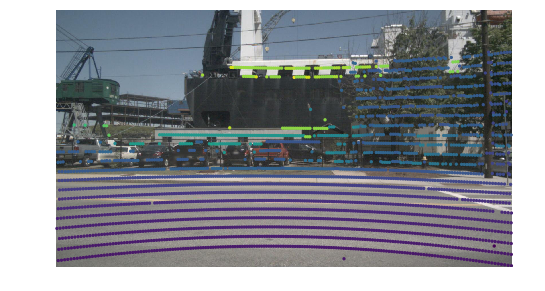

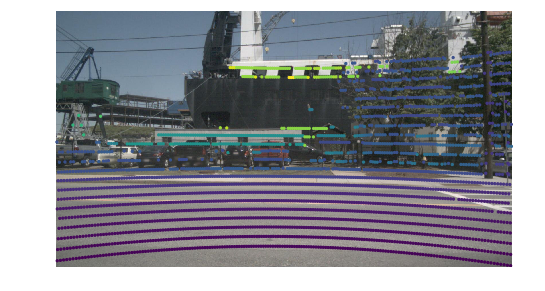

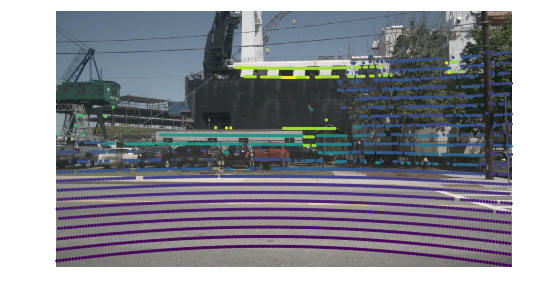

...

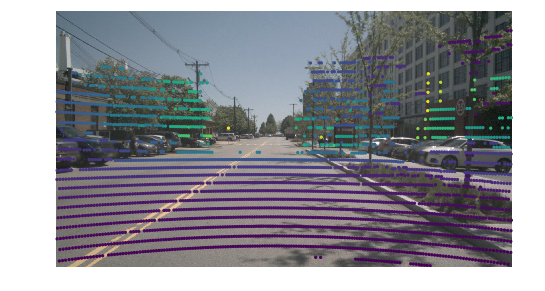

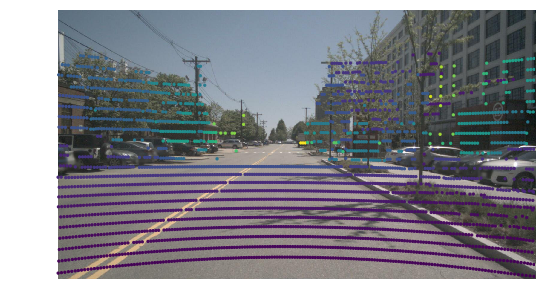

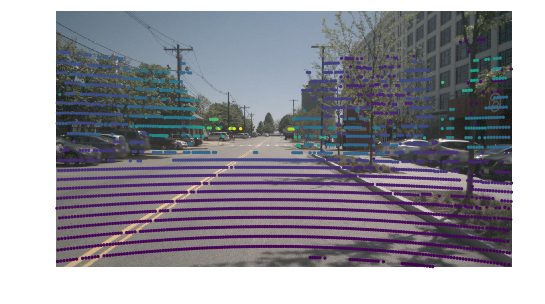

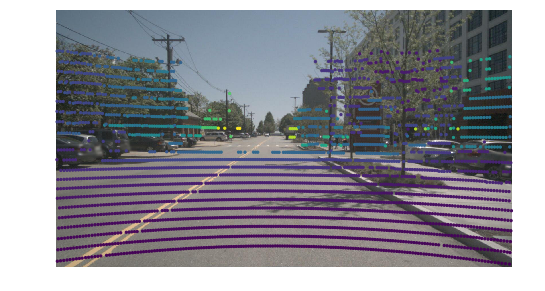

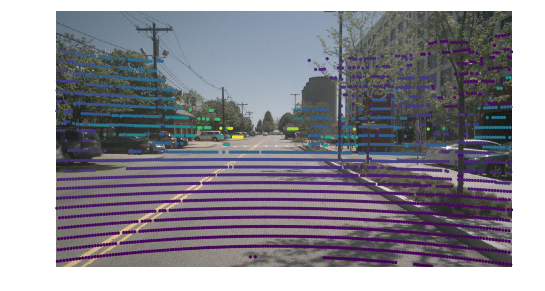

In [15]:
for i in range(60,90):
    my_sample = nusc.sample[i]
    nusc.render_pointcloud_in_image(my_sample['token'])
    

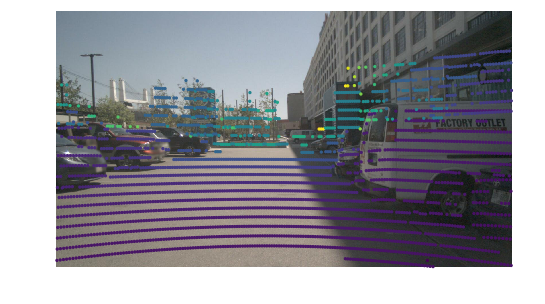

In [8]:
# First, let's plot a point-cloud in an image.
my_sample = nusc.sample[0]
nusc.render_pointcloud_in_image(my_sample['token'])

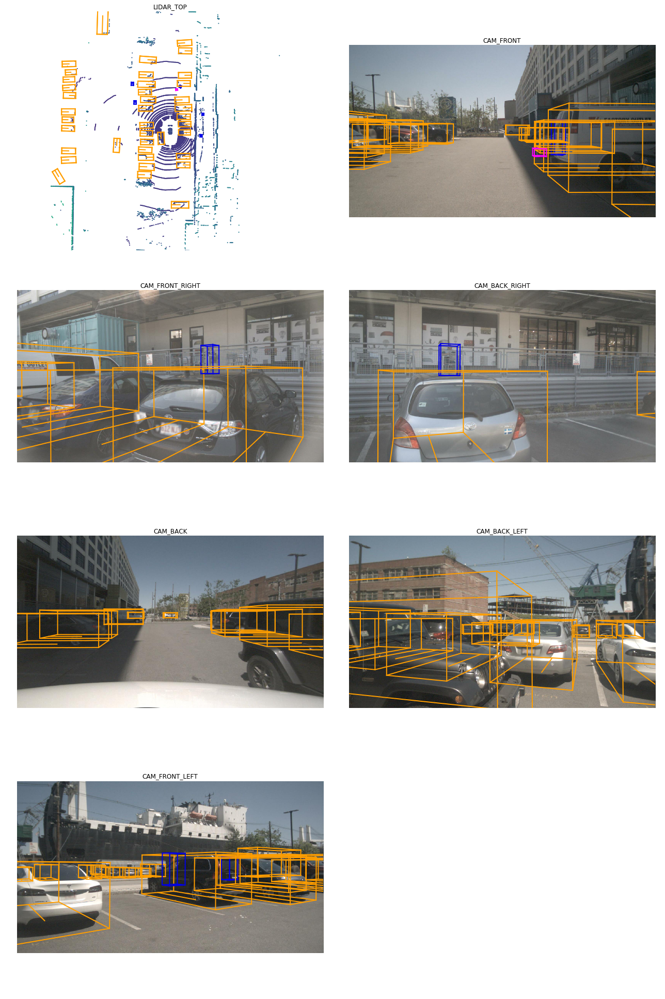

In [9]:
# We can also plot all annotations across all sample data for that sample
nusc.render_sample(my_sample['token'])

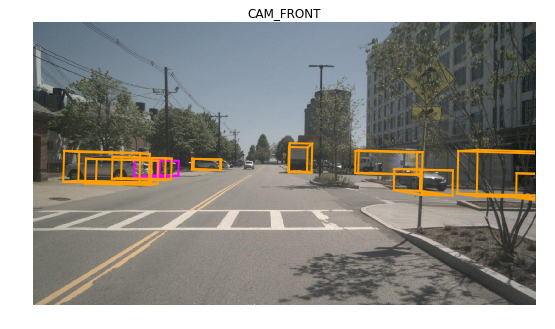

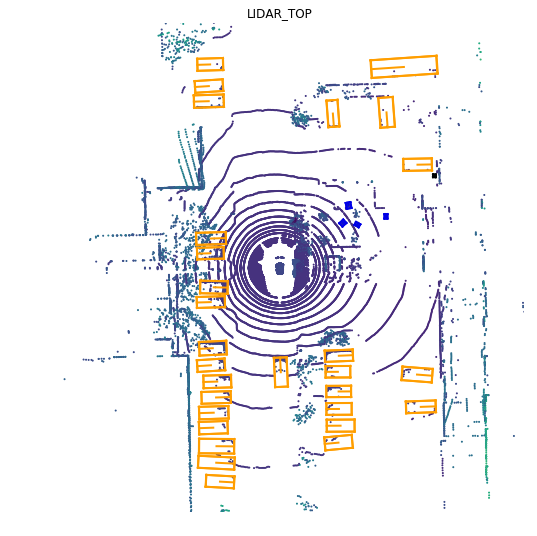

In [19]:
# Or if we only want to render a particular sensor, we can specify that
nusc.render_sample_data(my_sample['data']['CAM_FRONT'])
nusc.render_sample_data(my_sample['data']['LIDAR_TOP'])

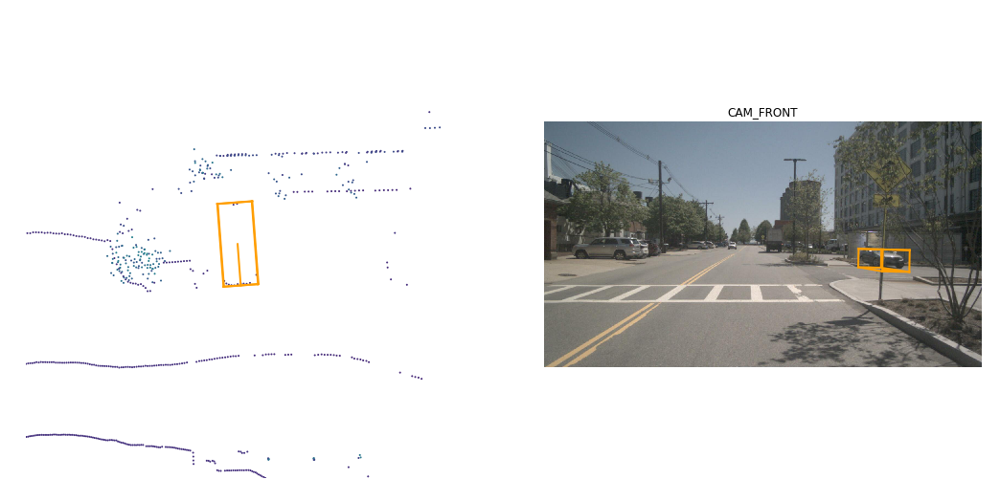

In [20]:
# We can even render a specific annotation
nusc.render_annotation(my_sample['anns'][0])

In [6]:
# VISUALIZE AS A VIDEO
my_scene_token = nusc.field2token('scene', 'name', 'scene-0096')[0]
nusc.render_scene_channel(my_scene_token, 'CAM_FRONT') # UNCOMMENT

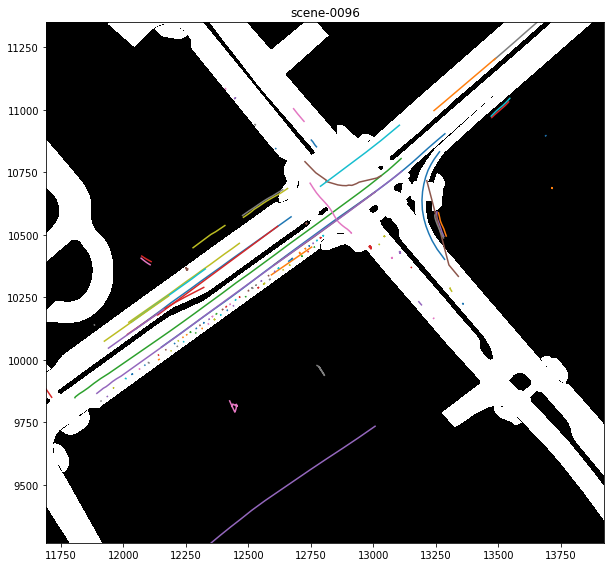

In [8]:
#map representation
map_trajs = load_traj_data(representar=True)